In [1]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import srsly
from datasets import load_from_disk
from matplotlib import ticker
from scipy.special import entr, softmax
from sklearn.manifold import TSNE
from tqdm.auto import tqdm

---

### T-SNE

In [ ]:
embeddings = np.load(f"../data/processed/agnews/ag_news_index.npy")
sample = embeddings[np.random.randint(0, 1, size=10_000)]
t_sne = TSNE(
    n_components=2,
    perplexity=100,
    init="random",
    n_iter=500,
    random_state=0,
    verbose=1,
)
S_t_sne = t_sne.fit_transform(embeddings)
plt.scatter(S_t_sne[:, 0], S_t_sne[:, 1])

---
## Full data

In [2]:
path_to_experiments = Path("../outputs/multirun/full_data/")

In [3]:
list_dfs = []
for dataset in path_to_experiments.iterdir():
    for run in dataset.iterdir():
        if not run.is_dir():
            continue
        df = pd.DataFrame(
            srsly.read_jsonl(run / "logs" / "test" / "epoch_level.jsonl")
        ).assign(dataset=dataset.name)
        list_dfs.append(df)

In [4]:
df = pd.concat(list_dfs)

In [8]:
df.groupby("dataset")[["f1_macro", "accuracy"]].agg(["mean", "std"])

f1_macro            accuracy          
                                          mean       std      mean       std
dataset                                                                     
agnews_bert_tiny_2023-03-04T15-36-30  0.927846  0.001986  0.927928  0.001899
imdb_bert_tiny_2023-03-04T15-38-25    0.880452  0.001109  0.880460  0.001099

---
## Active learning

In [171]:
path_to_experiment = Path("../outputs/multirun/reinit_study")
path_to_experiment

PosixPath('../outputs/multirun/reinit_study')

### Plots

In [205]:
data = []

for dataset in path_to_experiment.iterdir():
    for strategy in dataset.iterdir():
        for reinit in strategy.iterdir():
            for run in reinit.iterdir():
                if run.name.endswith("yaml"):
                    continue
                data_seed, model_seed, _ = run.name.split("_")
                results = pd.DataFrame(
                    srsly.read_jsonl(run / "logs" / "test" / "epoch_level.jsonl")
                ).assign(
                    data_seed=int(data_seed.split("=")[1]),
                    model_seed=int(model_seed.split("=")[1]),
                    dataset=dataset.name,
                    strategy=strategy.name,
                    experiment=f"{data_seed}_{model_seed}",
                    reinit=eval(str(reinit.name).split("=")[-1]),
                )
                data.append(results)

In [206]:
df = pd.concat(data)
df

,stage,epoch,loss,accuracy,f1_macro,f1_micro,precision_macro,precision_micro,recall_macro,recall_micro,data_seed,model_seed,dataset,strategy,experiment,reinit
0,test,0,0.699145,0.513899,0.501487,0.513899,0.516562,0.513899,0.514851,0.513899,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
1,test,1,1.001820,0.564227,0.552817,0.564227,0.572909,0.564227,0.565192,0.564227,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
2,test,2,1.174308,0.583880,0.581567,0.583880,0.586404,0.583880,0.584341,0.583880,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
3,test,3,1.415519,0.604222,0.596661,0.604222,0.611429,0.604222,0.603433,0.604222,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
4,test,4,1.073126,0.613583,0.613549,0.613583,0.613564,0.613583,0.613549,0.613583,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,test,95,0.448668,0.805819,0.805551,0.805819,0.808035,0.805819,0.806067,0.805819,0,1994,imdb_bert_tiny,random,data=0_model=1994,True
96,test,96,0.468201,0.805090,0.804879,0.805090,0.806005,0.805090,0.804924,0.805090,0,1994,imdb_bert_tiny,random,data=0_model=1994,True
97,test,97,0.498541,0.815301,0.815301,0.815301,0.815343,0.815301,0.815335,0.815301,0,1994,imdb_bert_tiny,random,data=0_model=1994,True
98,test,98,0.474551,0.810317,0.810312,0.810317,0.810310,0.810317,0.810316,0.810317,0,1994,imdb_bert_tiny,random,data=0_model=1994,True


In [207]:
df.groupby(["strategy", "reinit", "dataset", "data_seed", "model_seed"])[
    ["data_seed", "model_seed"]
].size()

strategy           reinit  dataset         data_seed  model_seed
entropy            False   imdb_bert_tiny  0          0              92
                                                      1994           92
                                           1994       0              92
                                                      1994           92
                   True    imdb_bert_tiny  0          0              92
                                                      1994           92
                                           1994       0              92
                                                      1994           92
margin_confidence  False   imdb_bert_tiny  0          0              92
                                                      1994           92
                                           1994       0              92
                                                      1994           92
                   True    imdb_bert_tiny  0          0              92

In [208]:
df_agg = (
    df.groupby(["dataset", "strategy", "reinit", "epoch"])[
        ["accuracy", "f1_macro", "precision_macro", "recall_macro"]
    ]
    .agg(["mean", "std", "min", "max"])
    .stack(0)
    .reset_index()
    .rename(columns={"level_4": "metric"})
)

In [209]:
df

,stage,epoch,loss,accuracy,f1_macro,f1_micro,precision_macro,precision_micro,recall_macro,recall_micro,data_seed,model_seed,dataset,strategy,experiment,reinit
0,test,0,0.699145,0.513899,0.501487,0.513899,0.516562,0.513899,0.514851,0.513899,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
1,test,1,1.001820,0.564227,0.552817,0.564227,0.572909,0.564227,0.565192,0.564227,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
2,test,2,1.174308,0.583880,0.581567,0.583880,0.586404,0.583880,0.584341,0.583880,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
3,test,3,1.415519,0.604222,0.596661,0.604222,0.611429,0.604222,0.603433,0.604222,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
4,test,4,1.073126,0.613583,0.613549,0.613583,0.613564,0.613583,0.613549,0.613583,1994,1994,imdb_bert_tiny,margin_confidence,data=1994_model=1994,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,test,95,0.448668,0.805819,0.805551,0.805819,0.808035,0.805819,0.806067,0.805819,0,1994,imdb_bert_tiny,random,data=0_model=1994,True
96,test,96,0.468201,0.805090,0.804879,0.805090,0.806005,0.805090,0.804924,0.805090,0,1994,imdb_bert_tiny,random,data=0_model=1994,True
97,test,97,0.498541,0.815301,0.815301,0.815301,0.815343,0.815301,0.815335,0.815301,0,1994,imdb_bert_tiny,random,data=0_model=1994,True
98,test,98,0.474551,0.810317,0.810312,0.810317,0.810310,0.810317,0.810316,0.810317,0,1994,imdb_bert_tiny,random,data=0_model=1994,True


In [216]:
a = (
    df.set_index(["epoch", "strategy", "reinit", "experiment"])[["f1_macro"]]
    .unstack("reinit")
    .reset_index()
    .assign(diff=lambda df_: df_.iloc[:, -2] - df_.iloc[:, -1])
)

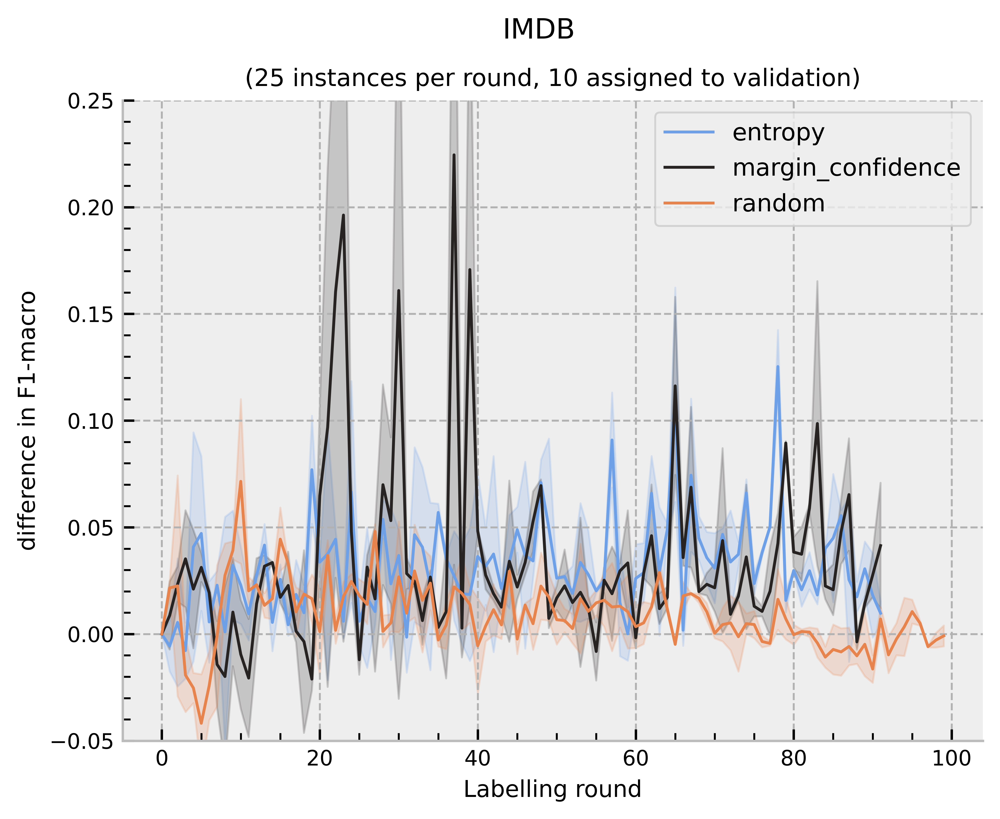

In [223]:
# colors = sns.color_palette("Spectral", n_colors=len(plot_data["strategy"].unique()))
colors = sns.diverging_palette(
    250, 30, l=65, center="dark", n=a["strategy"].nunique()
)

# sns.set_style("white", rc={"xtick.bottom" : True, "ytick.left" : True})
plt.style.use("bmh")
sns.set_context("paper")

# plot
fig, ax = plt.subplots()
fig.dpi = 800
sns.lineplot(a, x="epoch", y="diff", hue="strategy", ax=ax, palette=colors)
ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.01))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(5))

fig.suptitle("IMDB")
ax.set_title("(25 instances per round, 10 assigned to validation)", fontsize=10)
ax.set_ylabel("difference in F1-macro")
ax.set_xlabel("Labelling round")
ax.legend(fontsize=10, bbox_to_anchor=(1, 1))
ax.set_ylim(-0.05, 0.25)

sns.despine()
plt.show()

In [29]:
plot_data = df_agg.loc[
    (df_agg["dataset"].str.contains("imdb")) & (df_agg["metric"] == "f1_macro")
].rename(columns={"reinit": "re-initialise", "epoch": "round"})
plot_data

,dataset,strategy,re-initialise,round,metric,max,mean,min,std
1,imdb_bert_tiny,entropy,False,0,f1_macro,0.520091,0.510789,0.501487,0.010741
5,imdb_bert_tiny,entropy,False,1,f1_macro,0.527485,0.508641,0.489797,0.021759
9,imdb_bert_tiny,entropy,False,2,f1_macro,0.582943,0.560342,0.537740,0.026098
13,imdb_bert_tiny,entropy,False,3,f1_macro,0.613617,0.590826,0.568036,0.026316
17,imdb_bert_tiny,entropy,False,4,f1_macro,0.628827,0.626574,0.624321,0.002602
...,...,...,...,...,...,...,...,...,...
2253,imdb_bert_tiny,random,True,95,f1_macro,0.805551,0.791023,0.776495,0.016775
2257,imdb_bert_tiny,random,True,96,f1_macro,0.804879,0.797832,0.790784,0.008138
2261,imdb_bert_tiny,random,True,97,f1_macro,0.815301,0.809024,0.802747,0.007248
2265,imdb_bert_tiny,random,True,98,f1_macro,0.810312,0.802684,0.795056,0.008808


In [166]:
plot_data.s

,round,strategy,re-initialise,metric,,max,mean,min,size,std
0,0,entropy,False,entropy,NaN,0.693147,0.677751,0.594361,99216.0,0.016912
1225,51,entropy,False,margin,NaN,0.999321,0.896514,0.000070,94116.0,0.226423
1224,51,entropy,False,entropy,NaN,0.693147,0.115997,0.003053,94116.0,0.210191
1211,50,entropy,True,strategy,margin_confidence,NaN,NaN,NaN,NaN,NaN
1210,50,entropy,True,reinit,False,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
452,18,margin_confidence,True,prob_pred,NaN,0.984932,0.757357,0.500004,97416.0,0.196934
453,18,margin_confidence,True,prob_true,NaN,0.984932,0.651507,0.015209,97416.0,0.286464
454,18,margin_confidence,True,reinit,False,NaN,NaN,NaN,NaN,NaN
447,18,margin_confidence,False,prob_true,NaN,0.998964,0.721603,0.001079,97416.0,0.369212


In [30]:
sns.diverging_palette(250, 30, l=65, center="dark", n=3)

[(0.4265534711840377, 0.6260975213663689, 0.9072715683943962),
 (0.14918455888545099, 0.1381228160190642, 0.13476544093324597),
 (0.90499399934908, 0.5182704637470051, 0.3064196349089693)]

In [32]:
def plot(plot_data, dpi, ymin, hline, title, metric):
    # colors = sns.color_palette("Spectral", n_colors=len(plot_data["strategy"].unique()))
    colors = sns.diverging_palette(
        250, 30, l=65, center="dark", n=plot_data["strategy"].nunique()
    )

    # sns.set_style("white", rc={"xtick.bottom" : True, "ytick.left" : True})
    plt.style.use("bmh")
    sns.set_context("paper")

    # plot
    fig, ax = plt.subplots()
    fig.dpi = dpi

    sns.lineplot(
        data=plot_data,
        x="round",
        y="mean",
        hue="strategy",
        style="re-initialise",
        palette=colors,
        ax=ax,
    )

    # fill area between min and max for each group
    for group1, group1_data in plot_data.groupby("strategy"):
        group_color = colors[plot_data["strategy"].unique().tolist().index(group1)]

        for _, group2_data in group1_data.groupby("re-initialise"):

            ax.fill_between(
                group2_data["round"],
                group2_data["min"],
                group2_data["max"],
                alpha=0.2,
                color=group_color,
            )

    # add 90% line
    ax.hlines(hline, *plt.xlim(), colors="red")

    ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.01))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(5))
    ax.set_xlim(0, 100)
    ax.set_ylim(ymin)

    fig.suptitle(title)
    ax.set_title("(25 instances per round, 10 assigned to validation)", fontsize=10)
    ax.set_ylabel(metric)
    ax.set_xlabel("Labelling round")
    ax.legend(fontsize=10, bbox_to_anchor=(1, 1))

    sns.despine()
    plt.show()

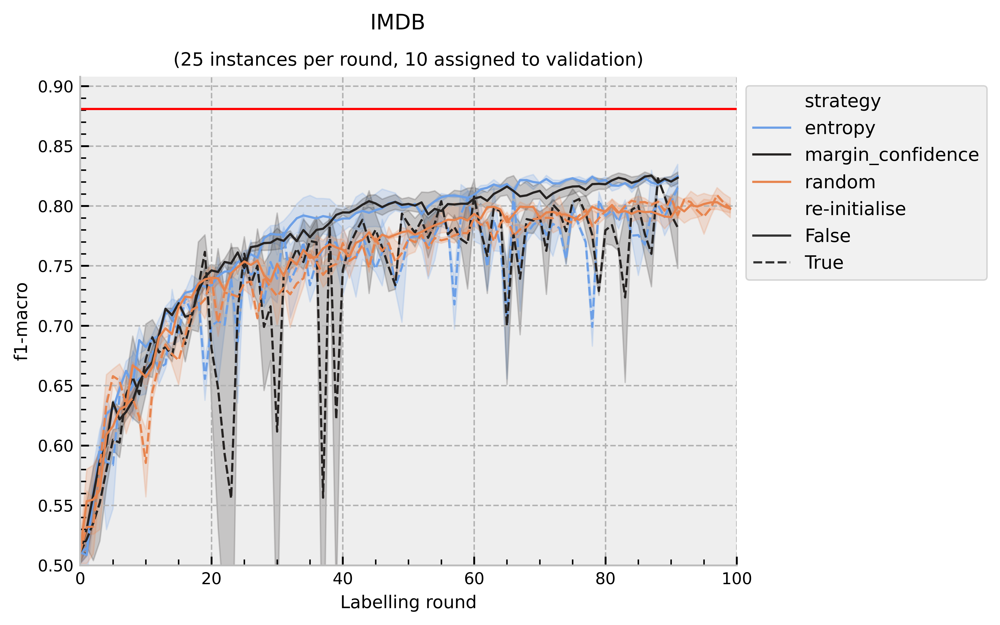

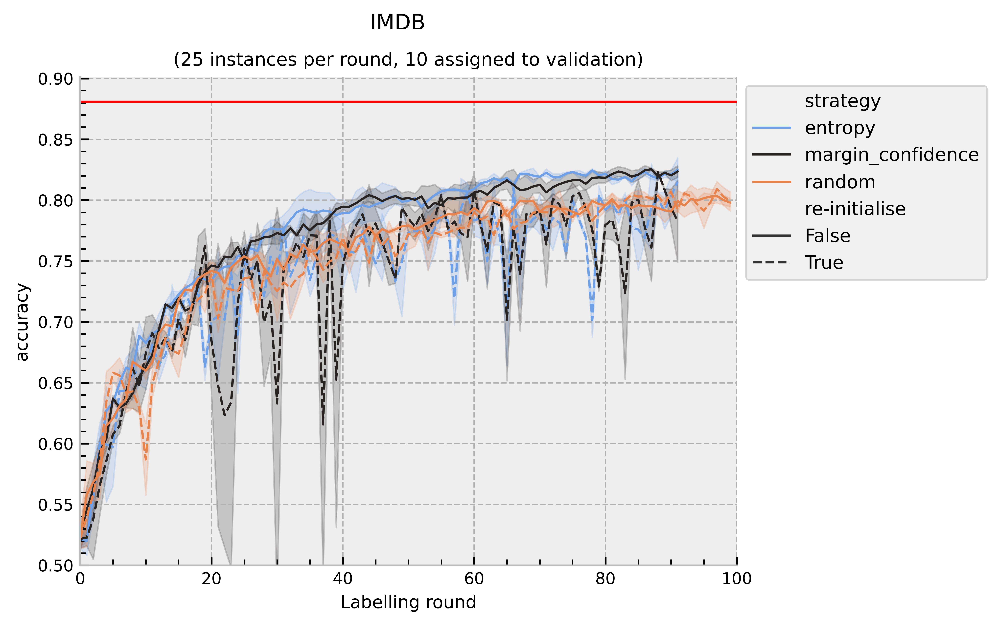

In [40]:
for metric in ("f1_macro", "accuracy"):
    plot_data = df_agg.loc[
        (df_agg["dataset"].str.contains("imdb")) & (df_agg["metric"] == metric)
    ].rename(columns={"reinit": "re-initialise", "epoch": "round"})
    plot(plot_data, 800, 0.5, 0.881, "IMDB", metric.replace("_", "-"))

---

### Cartography

In [41]:
dataset = "agnews"
strategy = "entropy"

In [42]:
original_df = load_from_disk(f"../data/processed/{dataset}/")["train"].to_pandas()

/home/pl487/.conda/envs/allset/lib/python3.9/site-packages/datasets/dataset_dict.py:1241: FutureWarning: 'fs' was is deprecated in favor of 'storage_options' in version 2.8.0 and will be removed in 3.0.0.
You can remove this warning by passing 'storage_options=fs.storage_options' instead.
  warnings.warn(


In [67]:
path.parents[3]

PosixPath('../outputs/multirun/reinit_study/imdb_bert_tiny/entropy/reinit=True')

In [81]:
list_dfs = []
for path in tqdm(list(path_to_experiment.rglob("*/*/logs/pool/*.csv"))):
    data_seed, model_seed, _ = path.parents[2].name.split("_")
    df = pd.read_csv(path).assign(
        data_seed=int(data_seed.split("=")[1]),
        model_seed=int(model_seed.split("=")[1]),
        strategy=path.parents[4].name,
        experiment=f"{data_seed}_{model_seed}",
        reinit=eval(path.parents[3].name.split("=")[-1]),
    )
    list_dfs.append(df)

  0%|          | 0/1456 [00:00<?, ?it/s]

In [82]:
df = pd.concat(list_dfs).reset_index(drop=True)

In [84]:
df = pd.merge(
    df,
    original_df[["unique_id", "labels"]],
    on="unique_id",
    how="left",
)

In [85]:
# add logits and margin
logits = df.iloc[:, df.columns.str.startswith("logit")].values
probs = softmax(logits, axis=1)
sorted_probs = np.take_along_axis(probs, probs.argsort(-1), axis=1)

In [87]:
df = df.assign(
    entropy=entr(probs).sum(-1),
    margin=sorted_probs[:, -1] - sorted_probs[:, -2],
    preds=probs.argmax(-1),
    prob_pred=probs.max(-1),
    prob_true=lambda df_: np.take_along_axis(
        probs, df_["labels"].values.reshape(-1, 1), axis=1
    ),
)

In [88]:
df

,logit_0,logit_1,unique_id,round,scores,data_seed,model_seed,strategy,experiment,reinit,labels,entropy,margin,preds,prob_pred,prob_true
0,3.814464,-3.473301,10872,61,-0.998633,1994,1994,margin_confidence,data=1994_model=1994,False,0,0.005664,0.998633,0,0.999317,0.999317
1,3.897648,-3.560068,2401,61,-0.998847,1994,1994,margin_confidence,data=1994_model=1994,False,0,0.004877,0.998847,0,0.999423,0.999423
2,-3.946942,3.615327,16993,61,-0.998961,1994,1994,margin_confidence,data=1994_model=1994,False,1,0.004448,0.998961,1,0.999481,0.999481
3,-3.732727,3.440860,372,61,-0.998468,1994,1994,margin_confidence,data=1994_model=1994,False,0,0.006261,0.998468,1,0.999234,0.000766
4,3.754952,-3.404937,14949,61,-0.998447,1994,1994,margin_confidence,data=1994_model=1994,False,1,0.006337,0.998447,0,0.999223,0.000777
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34476619,-2.112690,1.771910,2034,40,0.098591,1994,0,entropy,data=1994_model=0,True,0,0.098591,0.959716,1,0.979858,0.020142
34476620,-2.211034,1.735328,16413,40,0.093958,1994,0,entropy,data=1994_model=0,True,1,0.093958,0.962083,1,0.981041,0.981041
34476621,-2.160961,1.801697,15012,40,0.092769,1994,0,entropy,data=1994_model=0,True,1,0.092768,0.962684,1,0.981342,0.981342
34476622,-2.210473,1.818519,16872,40,0.088067,1994,0,entropy,data=1994_model=0,True,1,0.088067,0.965038,1,0.982519,0.982519


In [101]:
# aggregate
df_agg = (
    df.groupby(["round", "strategy", "reinit"])[
        ["entropy", "margin", "prob_pred", "prob_true"]
    ]
    .agg(["mean", "max", "min", "std", "size"])
    .stack(0)
    .reset_index()
    .rename(columns={"level_3": "metric"})
)

In [122]:
df_agg = df_agg.assign(
    upper=lambda df_: df_["mean"] + 1 * df_["std"],
    lower=lambda df_: df_["mean"] - 1 * df_["std"],
)

In [147]:
df_agg

,round,strategy,reinit,metric,max,mean,min,size,std,upper,lower
0,0,entropy,False,entropy,0.693147,0.677751,0.594361,99216,0.016912,0.694663,0.660839
1,0,entropy,False,margin,0.437007,0.143840,0.000005,99216,0.098751,0.242592,0.045089
2,0,entropy,False,prob_pred,0.718503,0.571920,0.500002,99216,0.049376,0.621296,0.522544
3,0,entropy,False,prob_true,0.718503,0.503934,0.285468,99216,0.087149,0.591083,0.416784
4,0,entropy,True,entropy,0.693147,0.677751,0.594361,99216,0.016912,0.694663,0.660839
...,...,...,...,...,...,...,...,...,...,...,...
1451,90,margin_confidence,False,prob_true,0.999813,0.838385,0.000187,90216,0.333897,1.172282,0.504488
1452,90,margin_confidence,True,entropy,0.693147,0.409526,0.251319,90216,0.123307,0.532832,0.286219
1453,90,margin_confidence,True,margin,0.861789,0.677792,0.000077,90216,0.200326,0.878118,0.477466
1454,90,margin_confidence,True,prob_pred,0.930894,0.838896,0.500039,90216,0.100163,0.939059,0.738733


In [141]:
sns.diverging_palette(250, 30, l=65, center="dark", n=3)

[(0.4265534711840377, 0.6260975213663689, 0.9072715683943962),
 (0.14918455888545099, 0.1381228160190642, 0.13476544093324597),
 (0.90499399934908, 0.5182704637470051, 0.3064196349089693)]

In [151]:
def plot(plot_data, dpi, ymin, title, metric, y):
    colors = sns.diverging_palette(250, 30, l=65, center="dark", n=3)[:2]

    plt.style.use("bmh")
    sns.set_context("paper")

    # plot
    fig, ax = plt.subplots()
    fig.dpi = dpi

    sns.lineplot(
        data=plot_data.loc[(plot_data["metric"] == metric)],
        x="round",
        y=y,
        hue="strategy",
        style="reinit",
        ax=ax,
        palette=colors,
    )

    # # fill area between min and max for each group
    # for group1, group1_data in plot_data.groupby("strategy"):
    #     group_color = colors[plot_data["strategy"].unique().tolist().index(group1)]

    #     for _, group2_data in group1_data.groupby("reinit"):
    #         ax.fill_between(
    #             group2_data["round"],
    #             group2_data["lower"],
    #             group2_data["upper"],
    #             alpha=0.2,
    #             color=group_color,
    #         )

    ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.1))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(5))
    # ax.set_xlim(0, 100)
    ax.set_ylim(ymin)

    fig.suptitle(title)
    ax.set_title(
        f"average {y} {metric} on the entire pool across rounds", fontsize=10
    )
    ax.set_ylabel(metric)
    ax.set_xlabel("Labelling round")
    ax.legend(fontsize=10, bbox_to_anchor=(1, 1))

    sns.despine()
    plt.show()

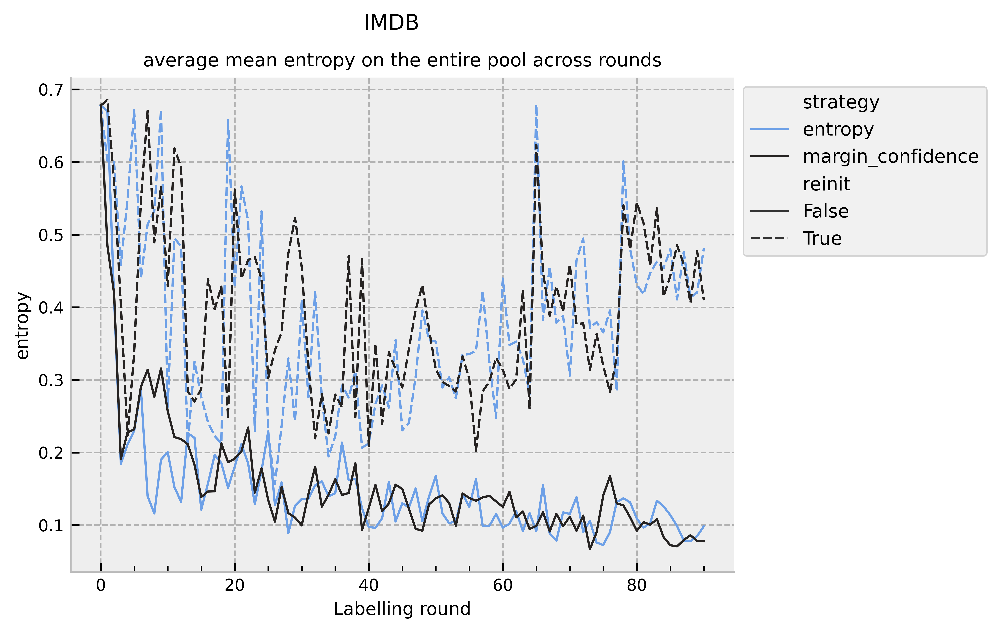

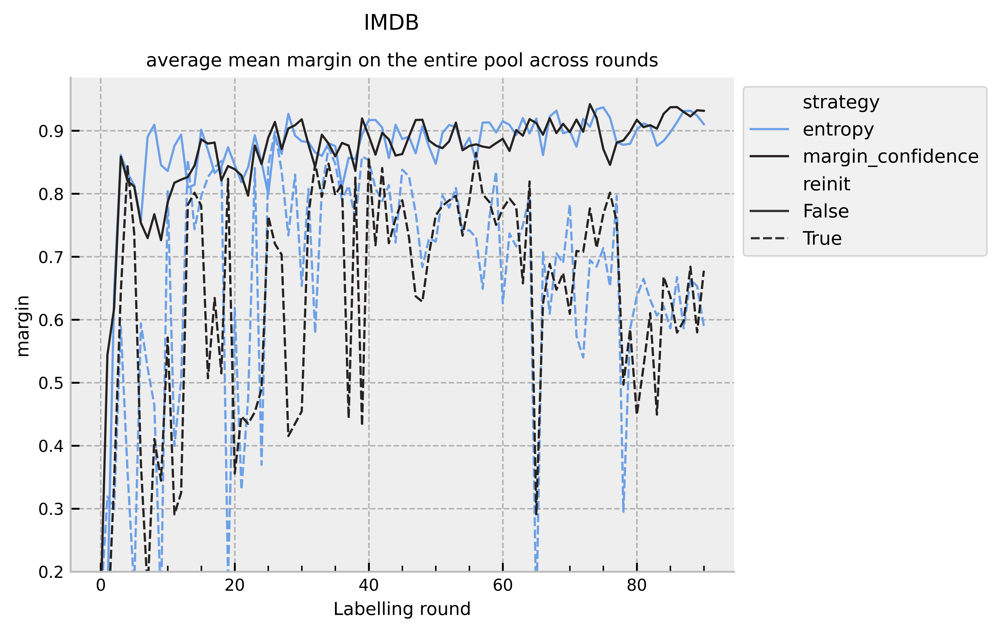

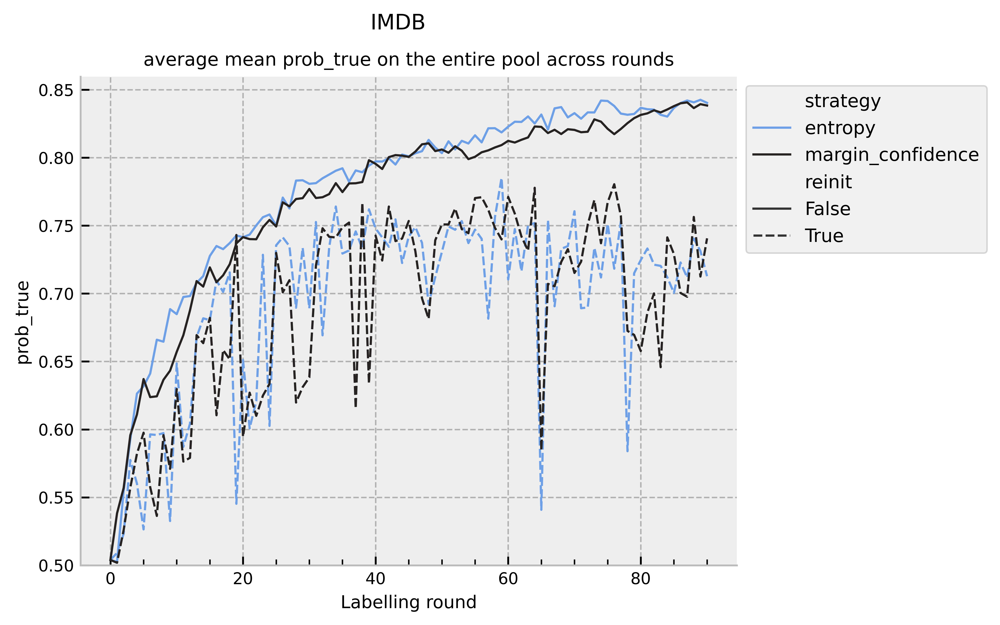

In [165]:
ymin = {
    "entropy": None,
    "margin": 0.2,
    "prob_true": 0.5,
}

for metric in ("entropy", "margin", "prob_true"):
    _min = ymin.get(metric)
    # _min = None
    plot(df_agg, dpi=800, ymin=_min, title="IMDB", metric=metric, y="mean")

In [57]:
import joypy

In [58]:
p = plot_data.loc[
    (plot_data["metric"] == "margin")
    & (plot_data["strategy"] == "entropy")
    & (plot_data["re-initialise"] == True)
]

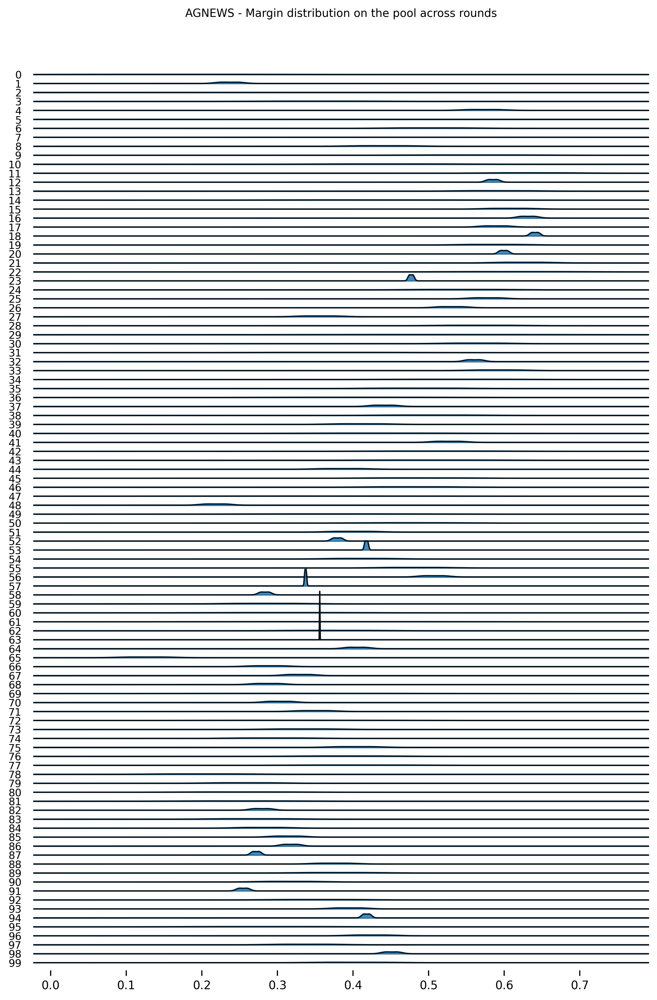

In [61]:
plt.style.use("default")
sns.set_context("paper")
fig, ax = joypy.joyplot(
    data=p[["mean", "round"]],
    by="round",
    figsize=(8, 12),
    alpha=0.85,
    ylabelsize=9,
    xlabelsize=10,
)
fig.dpi = 300
plt.title("AGNEWS - Margin distribution on the pool across rounds")
plt.show()

In [ ]:
plt.style.use("default")
sns.set_context("paper")
fig, ax = joypy.joyplot(
    data=a[["entropy", "epoch"]],
    by="epoch",
    figsize=(8, 12),
    alpha=0.85,
    ylabelsize=9,
    xlabelsize=10,
)
fig.dpi = 300
plt.title("AGNEWS - Entropy distribution on the pool across rounds")
plt.show()

In [ ]:
plt.style.use("default")
sns.set_context("paper")
fig, ax = joypy.joyplot(
    data=a[["prob_correct", "epoch"]],
    by="epoch",
    figsize=(8, 12),
    alpha=0.85,
    ylabelsize=9,
    xlabelsize=10,
)
fig.dpi = 300
plt.title("AGNEWS - Probability of being correct across rounds")
plt.show()

In [ ]:
df_agg = df.groupby(["unique_id"])[
    ["correct", "entropy", "margin", "prob_correct", "queried"]
].agg(["mean", "std", "size", "sum"])

In [ ]:
df_agg = df_agg.drop(columns=["correct", "queried"]).assign(
    correct=df_agg["correct"]["sum"], queried=df_agg["queried"]["mean"] < 1
)

In [ ]:
df_agg = df_agg.set_index(["correct", "queried"], append=True)

In [ ]:
df_agg = df_agg.stack(0).reset_index().rename(columns={"level_3": "metric"})

In [ ]:
df_agg = df_agg.drop(columns=["sum"])

In [ ]:
df_agg["correct_weighted"] = df_agg["correct"] / df_agg["size"]

In [ ]:
df_agg = df_agg.rename(
    columns={
        "correct_weighted": "correctly predicted (prop.)",
        "size": "num. times seen",
    }
)

In [ ]:
def plot(plot_data, dpi, title, metric):
    colors = sns.color_palette("viridis", as_cmap=True)

    plt.style.use("bmh")
    sns.set_context("paper")

    # plot
    fig, ax = plt.subplots()
    fig.dpi = dpi

    # sns.scatterplot(plot_data, x="std", y="mean", hue="correctly predicted (prop.)", size="num. times seen", ax=ax, palette=colors, alpha=0.5, sizes=(1, 100))
    sns.scatterplot(
        plot_data,
        x="std",
        y="mean",
        hue="correctly predicted (prop.)",
        ax=ax,
        palette=colors,
        alpha=0.5,
    )

    ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.05))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.05))

    fig.suptitle(title)
    ax.set_title("(averaged across epochs and labelling rounds)", fontsize=10)
    ax.set_ylabel(metric)
    ax.set_xlabel("std")
    ax.legend(fontsize=10, bbox_to_anchor=(1, 1))

    sns.despine()
    plt.show()

In [ ]:
plot_data = df_agg.loc[df_agg["metric"] == "prob_correct"]
plot(
    plot_data,
    dpi=800,
    title="IMDB - Entropy strategy without re-initialization",
    metric="average probability of the correct class",
)

In [ ]:
plot_data = df_agg.loc[
    (df_agg["metric"] == "entropy") & (df_agg["queried"] == False)
]
plot(
    plot_data,
    dpi=300,
    title="IMDB - Entropy strategy without re-initialization",
    metric="average entropy",
)

In [ ]:
plot_data = df_agg.loc[(df_agg["metric"] == "margin") & (df_agg["queried"] == False)]
plot(
    plot_data,
    dpi=800,
    title="IMDB - Entropy strategy with re-initialization",
    metric="average margin",
)

In [ ]:
plot_data.loc[plot_data["queried"] == False]

In [ ]:
import os
import shutil
from pathlib import Path

In [ ]:
path = Path("../outputs/multirun/reinit_effect/")

In [ ]:
s_path = list(path.glob("imdb*random*"))[0]
s_path

In [ ]:
# for i in list(s_path.rglob("+*")):
#     # shutil.rmtree(i)
#     for j in i.iterdir():
#         dest = i.parents[1] / i.parents[0].name / j.name
#         # shutil.move(j, dest)
#         print(dest)

In [ ]:
for i in s_path.iterdir():
    if not "+" in str(i):
        continue
    base_path, reinit, data_seed, _, _, model_seed, strategy, *_ = str(i).split(",")
    base_path = Path(base_path.split("+")[0])
    reinit = reinit.split(".")[1]

    new_path = base_path / reinit / f"{data_seed}_{model_seed}"
    for j in i.iterdir():
        dest = new_path / j.name
        # print(j)
        # print(dest)
        shutil.move(j, dest)

In [ ]:
import pandas as pd
import srsly
from datasets import load_from_disk

pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_columns", None)
import torch
from scipy.special import entr, softmax
from scipy.stats import entropy
from torch.special import entr as tentr

In [ ]:
labelled_df = pd.read_parquet(
    "../outputs/small_budget/imdb_bert_tiny_2023-02-28T15-53-18/logs/labelled_dataset.parquet"
)

In [ ]:
labelled_df = labelled_df.loc[labelled_df["labelling_round"] == 0]

In [ ]:
labelled_df

In [ ]:
pool_df = pd.read_csv(
    "/home/pl487/allset/outputs/small_budget/imdb_bert_tiny_2023-02-28T15-53-18/logs/pool/instance_level_round=0.csv"
)

In [ ]:
cols = pool_df.columns[pool_df.columns.str.startswith("logit")].tolist()
logits = pool_df[cols].values

In [ ]:
e = entropy(logits, axis=1)
e.argsort()[::-1]

In [ ]:
e2 = entr(softmax(logits, axis=1)).sum(1)
e2.argsort()[::-1]

In [ ]:
entr(softmax(logits, axis=1)).sum(-1)

In [ ]:
logits_tensor = torch.tensor(logits)
tentr(logits_tensor.softmax(-1)).sum(-1)

In [ ]:
scores = entr(softmax(logits, axis=1)).sum(-1)

In [ ]:
scores.max()

In [ ]:
scores[scores.argsort()[::-1]]

In [ ]:
indices = scores.argsort()[::-1][:25]
ids = pool_df["unique_id"][indices]

In [ ]:
set(labelled_df["unique_id"].unique()) == set(indices)

In [ ]:
labelled_df[labelled_df["unique_id"].isin(ids)]

In [ ]:
dd = pd.merge(df, original_df, on=["unique_id", "labels"], how="inner")